In [1]:
import pandas as pd 
import matplotlib.pyplot as plt 
import seaborn as sns 
import numpy as np 
import string 
import spacy 
from spacy.lang.pt.stop_words import STOP_WORDS

from tqdm import tqdm 

In [2]:
pln=spacy.load('pt_core_news_sm')
stop_words=STOP_WORDS

pontuacoes=string.punctuation
pontuacoes=pontuacoes+"..."+" "

In [3]:

stop_words.add("o")
stop_words.add("e")

stop_words.add("d")
stop_words.add("pra")
stop_words.add("q")


In [4]:
def processamento(texto):
    # texto em minuscula
    texto=texto.lower()
    documento=pln(texto)
    
    #removendo stop words
    lista_tokens_1=[]
    for p in documento:
        if (p.text in stop_words)==False:
            lista_tokens_1.append(p)
    #removendo pontuações      
    lista_tokens_2=[]
    for p in lista_tokens_1:
        if (p.text in pontuacoes)==False:
            lista_tokens_2.append(p)
    #lematização de tokens        
    lista_tokens_3=[]
    for p in lista_tokens_2:
        lista_tokens_3.append(p.lemma_)
        
    lista_tokens_4=[]
    for p in lista_tokens_3:
        if (p in stop_words)==False:
            lista_tokens_4.append(p)

    return lista_tokens_4

In [5]:
df=pd.read_csv("instagram_comentarios_wr.csv")
df

,x1i10hfl href,xpdipgo src,_ap3a,x1i10hfl href 3,x1ejq31n,x1lliihq,x1lliihq 2,x1lliihq 3,x1lliihq 4,x1lliihq 5,x1lliihq 6
0,https://www.instagram.com/axcel.xy/,https://scontent.cdninstagram.com/v/t51.2885-1...,axcel.xy,https://www.instagram.com/p/C-qlwTWRdJJ/c/1801...,4 sem,Você merece toda a taxação que ta recebendo se...,13.534 curtidas,Responder,Ver tradução,Curtir,Ver todas as 139 respostas
1,https://www.instagram.com/jhonnataferraz/,https://scontent.cdninstagram.com/v/t51.2885-1...,jhonnataferraz,https://www.instagram.com/p/C-qlwTWRdJJ/c/1808...,3 sem,Se fez o L para mim nao e gamer,6.618 curtidas,Responder,Ver tradução,Curtir,Ver todas as 145 respostas
2,https://www.instagram.com/teol_bm/,https://scontent.cdninstagram.com/v/t51.2885-1...,teol_bm,https://www.instagram.com/p/C-qlwTWRdJJ/c/1802...,2 sem,Gamer não é petista uma verdade que poucos ace...,6.080 curtidas,Responder,Ver tradução,Curtir,Ver todas as 146 respostas
3,https://www.instagram.com/christiangauss/,https://scontent.cdninstagram.com/v/t51.2885-1...,christiangauss,https://www.instagram.com/p/C-qlwTWRdJJ/c/1806...,1 sem,"Gamer n vota no L, Bolsonaro que reduziu as ta...",766 curtidas,Responder,Ver tradução,Curtir,Ver todas as 54 respostas
4,https://www.instagram.com/index.davui/,https://scontent.cdninstagram.com/v/t51.2885-1...,index.davui,https://www.instagram.com/p/C-qlwTWRdJJ/c/1800...,3 sem,nada melhor do que ver petistas reclamando de ...,2.200 curtidas,Responder,Ver tradução,Curtir,Ver todas as 5 respostas
...,...,...,...,...,...,...,...,...,...,...,...
1102,https://www.instagram.com/mavomax/,https://scontent-for1-1.cdninstagram.com/v/t51...,mavomax,https://www.instagram.com/p/C-qlwTWRdJJ/c/1801...,2 sem,"Se tiver votado no lula mesmo, desejo que rece...",Responder,Ver tradução,NaN,Curtir,NaN
1103,https://www.instagram.com/pedrohcavalcanti/,https://scontent-for1-1.cdninstagram.com/v/t51...,pedrohcavalcanti,https://www.instagram.com/p/C-qlwTWRdJJ/c/1798...,2 sem,😂😂😂😂,1 curtida,Responder,NaN,Curtir,NaN
1104,https://www.instagram.com/liawoin/,https://scontent-for1-1.cdninstagram.com/v/t51...,liawoin,https://www.instagram.com/p/C-qlwTWRdJJ/c/1795...,2 sem,🤣🤣🤣,Responder,NaN,NaN,Curtir,NaN
1105,https://www.instagram.com/marqs_silva/,https://scontent-for1-1.cdninstagram.com/v/t51...,marqs_silva,https://www.instagram.com/p/C-qlwTWRdJJ/c/1803...,2 sem,"Por isso não é pro, lix",Responder,Ver tradução,NaN,Curtir,NaN


In [6]:
df.nunique()

x1i10hfl href      1087
xpdipgo src        1077
_ap3a              1087
x1i10hfl href 3    1057
x1ejq31n             27
x1lliihq            862
x1lliihq 2           39
x1lliihq 3            2
x1lliihq 4            1
x1lliihq 5            1
x1lliihq 6           20
dtype: int64

In [7]:
df.isna().sum()

x1i10hfl href         1
xpdipgo src           1
_ap3a                 1
x1i10hfl href 3      49
x1ejq31n             49
x1lliihq             58
x1lliihq 2            0
x1lliihq 3          358
x1lliihq 4         1011
x1lliihq 5            1
x1lliihq 6         1054
dtype: int64

In [8]:
df['x1i10hfl href 3'].iloc[3]

'https://www.instagram.com/p/C-qlwTWRdJJ/c/18064256242627750/'

In [9]:
df['x1lliihq'].iloc[10]

'Nós avisamos'

In [10]:
conteudo=''
for texto in df['x1lliihq'].values:
    try:
        conteudo=conteudo+" "+texto
    except:
        pass

In [11]:
resultado=processamento(conteudo)

In [12]:
pd.Series(resultado).value_counts().head(20)

😂            952
🤣            244
l            146
🇧            122
🇷            122
votar        110
taxar         95
bolsonaro     74
lula          67
pc            49
👏             48
n             44
gamer         44
merecer       42
tá            40
comprar       40
achar         37
petista       36
taxação       34
️             31
dtype: int64

In [13]:
from wordcloud import WordCloud

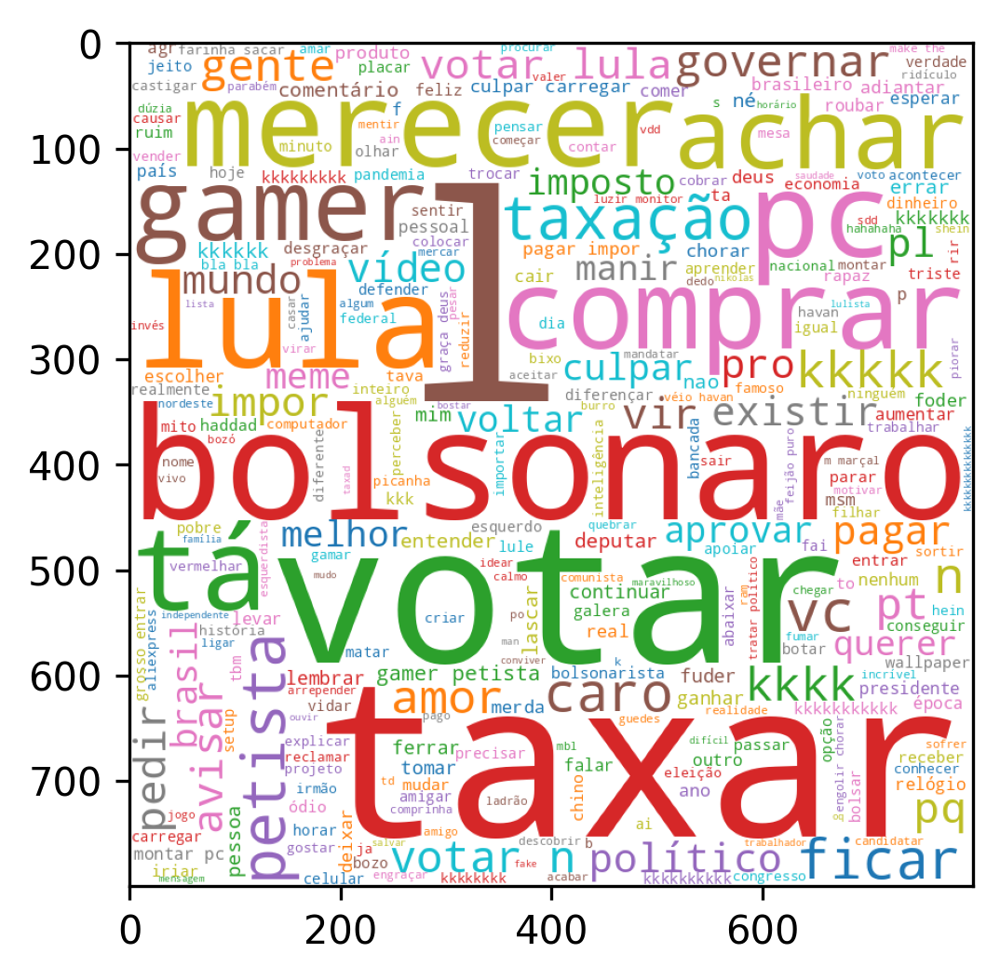

In [14]:
cloud=WordCloud(background_color="white",max_words=300,colormap='tab10',stopwords = stop_words, width = 800, height = 800)
cloud=cloud.generate(" ".join(resultado))
plt.figure(dpi=300)
plt.imshow(cloud)

# Emojis

In [15]:
import emoji

In [16]:
dir(emoji)

['EMOJI_DATA',
 'LANGUAGES',
 'STATUS',
 '__all__',
 '__author__',
 '__builtins__',
 '__cached__',
 '__doc__',
 '__email__',
 '__file__',
 '__license__',
 '__loader__',
 '__name__',
 '__package__',
 '__path__',
 '__source__',
 '__spec__',
 '__version__',
 'core',
 'demojize',
 'distinct_emoji_list',
 'emoji_count',
 'emoji_list',
 'emojize',
 'get_aliases_unicode_dict',
 'get_emoji_unicode_dict',
 'is_emoji',
 'replace_emoji',
 'unicode_codes',
 'version']

In [17]:
texto=df['x1lliihq'].iloc[5]
texto

'As pessoas comem computadores? 🤔'

In [18]:
emoji.emoji_list(texto)

[{'match_start': 31, 'match_end': 32, 'emoji': '🤔'}]

In [19]:
emoji.emoji_count(texto)

1

In [20]:
emoji.distinct_emoji_list(texto)

['🤔']

In [21]:
def captura_emoji(x):
    try:
        return emoji.distinct_emoji_list(x)
    except:
        return []

In [22]:
df['LISTA_EMOJI']=df['x1lliihq'].apply(captura_emoji)
df['LEN_LISTA_EMOJI']=df['LISTA_EMOJI'].apply(len)

In [23]:
df['LEN_LISTA_EMOJI'].describe()

count    1107.000000
mean        0.513098
std         0.655040
min         0.000000
25%         0.000000
50%         0.000000
75%         1.000000
max         4.000000
Name: LEN_LISTA_EMOJI, dtype: float64

In [24]:
lista=df['LISTA_EMOJI'].sum()

In [25]:
pd.Series(lista).value_counts()

😂     254
🤣      82
🇧🇷     81
👏      25
🙌      16
     ... 
😁       1
✌🏽      1
🤬       1
☝️      1
🎶       1
Length: 67, dtype: int64

In [26]:
for i in range(len(df)):
    lista=df['LISTA_EMOJI'].iloc[i]
    if "🤬" in lista: 
        print(df['x1lliihq'].iloc[i])

Matar 700 mil pessoas: ok! Mito!  Aumentar taxas pra salvaguardar indústria nacional: 🤬🤬🤬🤬🤬


In [27]:
def remover_emoji(x):
    try: 
        return emoji.replace_emoji(x).strip()
    except:
        return x 

In [28]:
df['TEXTO_LIMPO']=df['x1lliihq'].apply(remover_emoji)

In [29]:
conteudo=''
for texto in df['TEXTO_LIMPO'].values:
    try:
        conteudo=conteudo+" "+texto
    except:
        pass

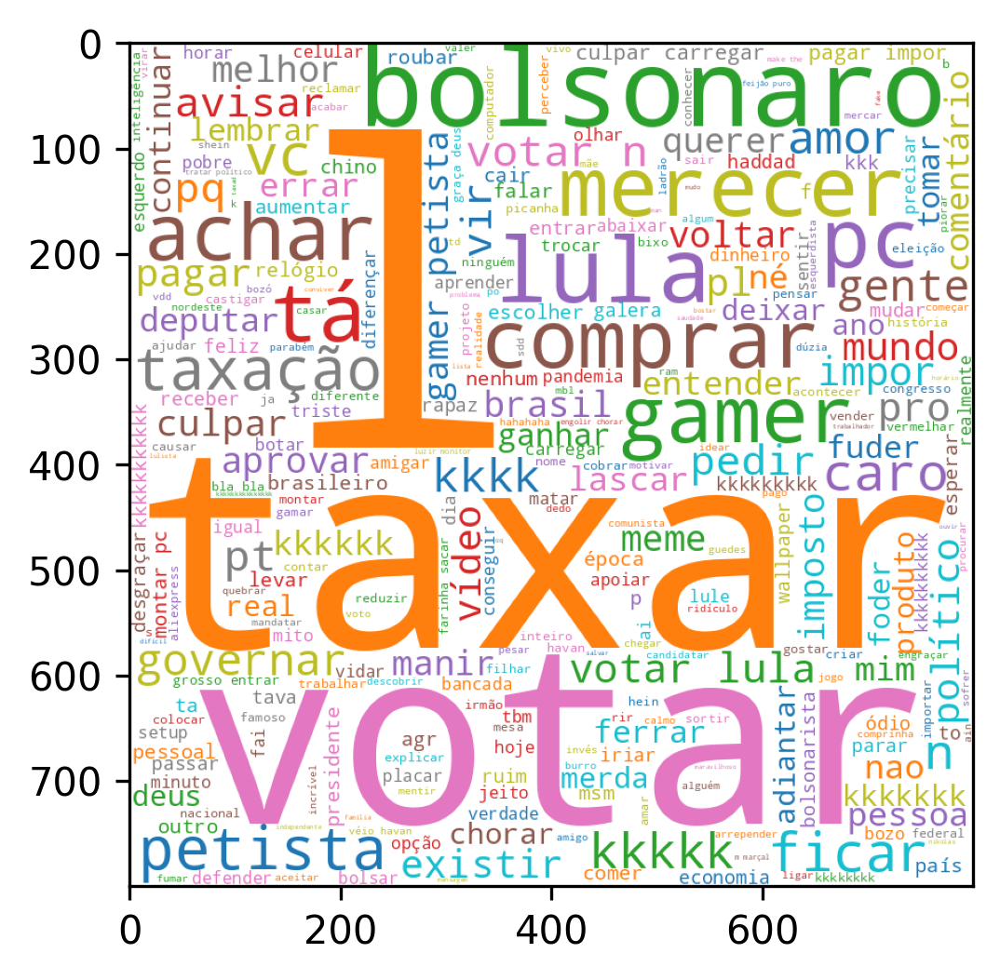

In [30]:
cloud=WordCloud(background_color="white",max_words=300,colormap='tab10',stopwords = stop_words, width = 800, height = 800)
cloud=cloud.generate(" ".join(resultado))
plt.figure(dpi=300)
plt.imshow(cloud)

# Similaridade textual

In [31]:
from sklearn.feature_extraction.text import CountVectorizer, TfidfTransformer

In [32]:
textoall=list(df['TEXTO_LIMPO'].dropna().values)

In [33]:
textoall

['Você merece toda a taxação que ta recebendo se votou nele, na vdd eu acho e pouco.',
 'Se fez o L para mim nao e gamer',
 'Gamer não é petista uma verdade que poucos aceitam…',
 'Gamer n vota no L, Bolsonaro que reduziu as taxas sobre games e consoles',
 'nada melhor do que ver petistas reclamando de taxa na interwebs kkkkk Faz o L de novo kkk',
 'As pessoas comem computadores?',
 'Se eu soubesse q o lula ia ferrar tanto os petistas ate eu teria votado nele, triste é todos os trabalhadores agr terem q conviver com isso',
 'Só lembrando que foi o Bolsonaro que deu aval para este projeto ser aprovado, inclusive o véio da Havan que ficou no pé dele para isso também kkkkk',
 'Merece coisa pior por ter feito o L',
 'Ainda me diziam porq nao votei no haddad, ou era o haddad ou bolsonaro  olha oq haddad ta fazendo e nem presidente é',
 'Nós avisamos',
 'Obrigado meu Deus por nunca ter sido lulista',
 'A bancada do PL inteira votou a favor e isso agradou o veio oda Havan',
 'Só 92% em import

In [34]:
def len_split(x):
    return len(x.strip().split())

In [35]:
pd.Series(textoall).apply(len_split).value_counts().sort_index()

0      231
1       44
2       38
3       84
4       54
5       47
6       58
7       48
8       52
9       59
10      46
11      36
12      28
13      25
14      23
15      17
16      16
17      19
18      18
19      10
20       5
21      12
22      11
23       6
24       7
25       1
26       6
27       2
28       2
29       3
30       1
31       1
32       3
33       2
34       1
35       1
36       1
37       2
38       4
39       2
40       1
41       2
42       1
43       1
44       2
45       1
47       2
48       1
50       2
52       1
56       1
57       1
62       2
66       1
70       1
111      1
118      1
145      1
dtype: int64

In [36]:
daux=pd.DataFrame({'TEXTO':textoall,"TAMANHO":pd.Series(textoall).apply(len_split)})
corpus=list(daux[daux.TAMANHO>0].TEXTO.values)
corpus

['Você merece toda a taxação que ta recebendo se votou nele, na vdd eu acho e pouco.',
 'Se fez o L para mim nao e gamer',
 'Gamer não é petista uma verdade que poucos aceitam…',
 'Gamer n vota no L, Bolsonaro que reduziu as taxas sobre games e consoles',
 'nada melhor do que ver petistas reclamando de taxa na interwebs kkkkk Faz o L de novo kkk',
 'As pessoas comem computadores?',
 'Se eu soubesse q o lula ia ferrar tanto os petistas ate eu teria votado nele, triste é todos os trabalhadores agr terem q conviver com isso',
 'Só lembrando que foi o Bolsonaro que deu aval para este projeto ser aprovado, inclusive o véio da Havan que ficou no pé dele para isso também kkkkk',
 'Merece coisa pior por ter feito o L',
 'Ainda me diziam porq nao votei no haddad, ou era o haddad ou bolsonaro  olha oq haddad ta fazendo e nem presidente é',
 'Nós avisamos',
 'Obrigado meu Deus por nunca ter sido lulista',
 'A bancada do PL inteira votou a favor e isso agradou o veio oda Havan',
 'Só 92% em import

In [37]:
vectorizer=CountVectorizer(tokenizer=processamento,stop_words=None,max_features=30,token_pattern=None)

In [38]:
vectorizer.fit(corpus)

CountVectorizer(max_features=30, token_pattern=None,
                tokenizer=<function processamento at 0x7fdcbd80e3a0>)

In [39]:
vocabulario=vectorizer.get_feature_names()
vocabulario

/home/jlbdearaujo/.local/lib/python3.8/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


['achar',
 'amor',
 'avisar',
 'bolsonaro',
 'caro',
 'comprar',
 'culpar',
 'ficar',
 'gamer',
 'gente',
 'governar',
 'impor',
 'kkkk',
 'kkkkk',
 'l',
 'l"•',
 'lula',
 'merecer',
 'n',
 'pagar',
 'pc',
 'petista',
 'político',
 'pt',
 'taxar',
 'taxação',
 'tá',
 'vc',
 'vir',
 'votar']

In [40]:
texto='Jorge Luiz '

In [41]:
vetor=vectorizer.transform([texto]).toarray()
vetor

array([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0]])

In [42]:
vectorizer=CountVectorizer(tokenizer=processamento,stop_words=None,max_features=300,token_pattern=None)

In [43]:
vectorizer.fit(corpus)

CountVectorizer(max_features=300, token_pattern=None,
                tokenizer=<function processamento at 0x7fdcbd80e3a0>)

In [44]:
from sklearn.metrics.pairwise import cosine_distances, cosine_similarity

In [45]:
texto1='Voce é uma otima pessoa'
texto2="Voce é uma pessoa maravilhosa"
vetor1=vectorizer.transform([texto1]).toarray()
vetor2=vectorizer.transform([texto2]).toarray()
print(cosine_similarity(vetor1.reshape(1,-1),vetor2.reshape(1,-1))[0][0] )
print(cosine_distances(vetor1.reshape(1,-1),vetor2.reshape(1,-1))[0][0] )

1.0
0.0


In [46]:
texto1='Eu amo o lula'
texto2="eu amo o Bolsonaro"
vetor1=vectorizer.transform([texto1]).toarray()
vetor2=vectorizer.transform([texto2]).toarray()
print(cosine_similarity(vetor1.reshape(1,-1),vetor2.reshape(1,-1))[0][0] )
print(cosine_distances(vetor1.reshape(1,-1),vetor2.reshape(1,-1))[0][0] )

0.4999999999999999
0.5000000000000001


In [47]:
texto1='Meu carro azul'
texto2="eu amo o Bolsonaro"
vetor1=vectorizer.transform([texto1]).toarray()
vetor2=vectorizer.transform([texto2]).toarray()
print(cosine_similarity(vetor1.reshape(1,-1),vetor2.reshape(1,-1))[0][0] )
print(cosine_distances(vetor1.reshape(1,-1),vetor2.reshape(1,-1))[0][0] )

0.0
1.0


# Similaridade Semantica

In [48]:
from sentence_transformers import SentenceTransformer

In [49]:
model = SentenceTransformer('tubyneto/bertimbau')

No sentence-transformers model found with name /home/jlbdearaujo/.cache/torch/sentence_transformers/tubyneto_bertimbau. Creating a new one with MEAN pooling.
Some weights of the model checkpoint at /home/jlbdearaujo/.cache/torch/sentence_transformers/tubyneto_bertimbau were not used when initializing BertModel: ['cls.predictions.transform.dense.weight', 'cls.predictions.decoder.weight', 'cls.seq_relationship.bias', 'cls.seq_relationship.weight', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.bias', 'cls.predictions.transform.dense.bias', 'cls.predictions.transform.LayerNorm.bias']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassific

In [50]:
vetores=model.encode(corpus)

In [51]:
vetores.shape

(818, 768)

In [52]:
model.encode('Faz o L')

array([ 2.73403198e-01, -1.31338760e-01,  3.36630106e-01,  2.16284007e-01,
       -6.33782595e-02, -2.39205118e-02, -1.09487988e-01,  3.98744047e-02,
        2.22004175e-01,  2.80233145e-01,  1.25609681e-01,  1.79592222e-01,
       -2.61497289e-01, -1.52940482e-01,  1.96494415e-01,  2.33789772e-01,
        7.37592578e-04,  2.31706500e-01,  6.53472766e-02,  2.78358757e-01,
       -4.27373350e-01,  1.45407841e-01,  2.96846628e-01, -1.66371137e-01,
        1.56661093e-01,  4.16487843e-01, -3.18354458e-01,  4.42431301e-01,
        5.89185655e-01, -4.35175955e-01,  2.13391542e-01,  2.42846772e-01,
       -1.24719359e-01,  1.41331673e-01,  1.12012818e-01,  1.04473151e-01,
        2.18249753e-01, -1.40761152e-01, -3.10454041e-01, -1.26848653e-01,
       -1.36903375e-01, -1.15896106e-01, -4.58570570e-01,  2.44351178e-01,
        2.58439511e-01, -1.98462963e-01, -1.05873801e-01,  3.61503720e-01,
       -3.40646476e-01,  4.30138588e-01, -1.04759715e-01, -8.09111819e-02,
       -4.00755107e-01,  

In [53]:
pd.DataFrame(vetores)

,0,1,2,3,4,5,6,7,8,9,...,758,759,760,761,762,763,764,765,766,767
0,-0.331609,-0.202230,0.259953,-0.074943,0.436234,0.279161,0.033517,0.162189,0.027646,-0.128574,...,0.098489,-0.022442,-0.486901,0.196212,0.206934,-0.598488,0.028259,0.034428,-0.031876,-0.173732
1,-0.030109,-0.477478,0.244845,0.121067,0.474315,0.338186,-0.049114,0.157375,0.355080,-0.350451,...,0.047193,-0.067277,-0.646586,0.038752,0.352591,-0.172719,-0.075267,0.014617,-0.042674,0.007447
2,0.026724,0.081457,0.266435,0.015372,0.411905,0.356556,0.042162,-0.032854,0.242669,-0.119265,...,0.200529,-0.181658,-0.584553,0.015538,0.216475,-0.518870,-0.067012,0.034015,0.069475,-0.276185
3,-0.240995,-0.213494,0.125353,-0.159365,0.324193,0.235978,0.106441,-0.003023,0.357735,-0.114663,...,0.241657,-0.019863,-0.625943,-0.045896,0.288677,-0.448360,-0.243805,-0.067936,0.183378,-0.049955
4,-0.082021,-0.260482,0.047177,-0.175375,0.466264,-0.011981,-0.069399,-0.003769,0.083328,-0.196333,...,0.094339,-0.019076,-0.396576,-0.393620,0.267978,-0.419373,0.217665,0.102876,-0.074305,-0.120681
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
813,0.007828,-0.218229,0.019556,0.195895,0.524385,0.367601,-0.111063,0.166308,-0.128097,-0.085390,...,-0.123390,0.198637,-0.339782,0.016928,0.104863,-0.292543,0.066113,-0.054268,-0.002722,-0.286607
814,-0.072300,0.080862,0.297206,0.065678,0.593310,0.190444,-0.103818,0.063859,0.229219,-0.013447,...,0.047391,0.021641,-0.270884,0.002194,0.360970,-0.434239,0.277522,-0.007733,-0.314152,-0.241209
815,0.058648,0.042265,0.267158,-0.099519,0.221405,0.267116,-0.076575,0.183555,0.123784,-0.041934,...,-0.152821,-0.180011,-0.320919,-0.109453,0.451181,-0.483112,0.013247,-0.058190,-0.281261,0.062281
816,0.315830,-0.112758,0.089181,0.036311,0.300508,0.240315,-0.205875,-0.162721,0.162096,-0.111772,...,-0.232173,0.234806,-0.796617,-0.177436,0.334412,-0.283417,0.162542,0.062332,0.192857,-0.180350


In [54]:
texto1='Voce é uma otima pessoa'
texto2="Voce é uma pessoa maravilhosa"
vetor1=model.encode(texto1)
vetor2=model.encode(texto2)
print(cosine_similarity(vetor1.reshape(1,-1),vetor2.reshape(1,-1))[0][0] )


0.90228844


In [55]:
texto1='Voce é uma otima pessoa'
texto2="O pessoa morreu de acidente de carro"
vetor1=model.encode(texto1)
vetor2=model.encode(texto2)
print(cosine_similarity(vetor1.reshape(1,-1),vetor2.reshape(1,-1))[0][0] )


0.4328301


In [56]:
texto1='Eu amo o Lula'
texto2="Adoramos o pt"
vetor1=model.encode(texto1)
vetor2=model.encode(texto2)
print(cosine_similarity(vetor1.reshape(1,-1),vetor2.reshape(1,-1))[0][0] )

0.6165772


In [57]:
texto1='Eu amo o Bolsonaro'
texto2="Eu amo o Lula"
vetor1=model.encode(texto1)
vetor2=model.encode(texto2)
print(cosine_similarity(vetor1.reshape(1,-1),vetor2.reshape(1,-1))[0][0] )

0.85769457


# Buscador

In [58]:
texto_busca="Faz o L!"

In [59]:
vetor_busca=model.encode([texto_busca])

In [60]:
vetor_base=model.encode(corpus)

In [61]:
similaridade=cosine_similarity(vetor_busca,vetor_base)
similaridade.shape

(1, 818)

In [62]:
dbusca=pd.DataFrame({'COSSENO':similaridade[0],'TEXTO':corpus}).sort_values('COSSENO',ascending=False).reset_index(drop=True)
dbusca.drop_duplicates().head(20)

,COSSENO,TEXTO
0,0.868950,Faz o L amigão
1,0.858554,Faz o L amigo
2,0.857198,Faz o L
15,0.837899,Vai fazer o L agora
16,0.827661,Faz o L.
17,0.805829,Faz o L agr
18,0.798825,Faz o
19,0.798760,faz o L
21,0.797496,Agora faz o L amr
22,0.772973,Agora faz o


In [63]:
def buscador(texto_busca):
    vetor_busca=model.encode([texto_busca])
    similaridade=cosine_similarity(vetor_busca,vetor_base)
    dbusca=pd.DataFrame({'COSSENO':similaridade[0],'TEXTO':corpus}).sort_values('COSSENO',ascending=False).reset_index(drop=True)
    dbusca.drop_duplicates().head(20)
    return dbusca

In [64]:
buscador("Bolsonaro é Norte, Bolsonaro é Nordeste")

,COSSENO,TEXTO
0,0.817212,"Bolsonaro é mort3, Bolsonaro é nordeste,cai 17"
1,0.768563,Te amo Bolsonaro
2,0.767465,Bolsonaro é meu caralho
3,0.762948,Meu pc antes era Bolsonaro e depois continuou ...
4,0.742699,Mal sabe eles que a cor do Bolsonaro é azul
...,...,...
813,0.302544,vai 17
814,0.280912,Faz do
815,0.274576,Projeto
816,0.261952,você


In [65]:
buscador("amor")

,COSSENO,TEXTO
0,0.719334,você
1,0.699716,O amor venceu
2,0.661329,Eu quero é mais
3,0.658853,Com amor / Sem amor
4,0.642200,Receba a taxada do amor com amor entra macio
...,...,...
813,0.160768,"Veja as taxas de desemprego, veja o PIB, veja ..."
814,0.157375,"Português: ""Faz o L""• English: ""Do the L""• Spa..."
815,0.151630,KKKKKKKKKKKKKKKKK MELHOR COMENTÁRIO
816,0.134579,"Quem é Jesus?Para o cego, é a luz.Para o famin..."


In [66]:
buscador("Quem é o Lula?")

,COSSENO,TEXTO
0,0.794436,Os petistas vendo quem realmente o Lula é
1,0.720176,Verdades que ninguém quer ouvir: não existe só...
2,0.718453,Mal sabe eles que a cor do Bolsonaro é azul
3,0.701063,Todo sofrimento pra quem votou no Lula é pouco
4,0.690356,Lula bombado
...,...,...
813,0.328190,Verde ficou top em
814,0.326117,Tarde demais
815,0.323439,Tome
816,0.315861,KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK AH N BIXO


# Arvore

In [67]:
pd.Series(corpus).nunique()

789

In [68]:
corpus_new=list(pd.Series(corpus).unique())
vetores_base_new=model.encode(corpus_new)

In [69]:
source=[]
target=[]
weight=[]
nn=len(corpus_new)
for i in tqdm(range(nn-1)):
    for j in range(i+1,nn):
        texto1=corpus_new[i]
        texto2=corpus_new[j]
        vetor1=vetores_base_new[i]
        vetor2=vetores_base_new[j]
        
        cosseno=cosine_similarity(vetor1.reshape(1,-1),vetor2.reshape(1,-1))[0][0]
        source.append(texto1)
        target.append(texto2)
        weight.append(cosseno)

100%|██████████| 788/788 [00:57<00:00, 13.79it/s] 


In [70]:

dd=pd.DataFrame({'ORIGEM':source,'DESTINO':target,'W':weight})
dd


,ORIGEM,DESTINO,W
0,Você merece toda a taxação que ta recebendo se...,Se fez o L para mim nao e gamer,0.722653
1,Você merece toda a taxação que ta recebendo se...,Gamer não é petista uma verdade que poucos ace...,0.767958
2,Você merece toda a taxação que ta recebendo se...,"Gamer n vota no L, Bolsonaro que reduziu as ta...",0.657402
3,Você merece toda a taxação que ta recebendo se...,nada melhor do que ver petistas reclamando de ...,0.733077
4,Você merece toda a taxação que ta recebendo se...,As pessoas comem computadores?,0.427046
...,...,...,...
310861,Mata as aulas de história e fica pensando que ...,"Por isso não é pro, lix",0.520207
310862,Mata as aulas de história e fica pensando que ...,Ver comentários ocultos,0.394044
310863,"Se tiver votado no lula mesmo, desejo que rece...","Por isso não é pro, lix",0.532691
310864,"Se tiver votado no lula mesmo, desejo que rece...",Ver comentários ocultos,0.423926


In [71]:
dd['W'].value_counts()

0.533423    4
0.578675    4
0.527788    4
0.597174    4
0.539267    3
           ..
0.746464    1
0.530195    1
0.601881    1
0.677812    1
0.436347    1
Name: W, Length: 304157, dtype: int64

In [72]:
import networkx as nx

In [73]:
G=nx.from_pandas_edgelist(dd,'ORIGEM','DESTINO','W')

In [74]:
source=[] 
target=[]
weight=[]

for a,b in tqdm(nx.maximum_spanning_tree(G,weight='W',algorithm='kruskal').edges):
    try:
        weight.append(dd[(dd['ORIGEM']==a)&(dd['DESTINO']==b)].W.values[0])
        source.append(a)
        target.append(b)
    except:
        pass

100%|██████████| 788/788 [00:22<00:00, 35.14it/s]


In [75]:
dtree=pd.DataFrame({'ORIGEM':source,'DESTINO':target,'W':weight})

In [76]:
dtree

,ORIGEM,DESTINO,W
0,Você merece toda a taxação que ta recebendo se...,"Vc merece é o dobro de taxa, vc votou nele",0.853912
1,Você merece toda a taxação que ta recebendo se...,Tu merece taxação de 300% por ter votado no lula,0.843537
2,Você merece toda a taxação que ta recebendo se...,"É meme, mas quem votou nele tem oq merece",0.836514
3,Você merece toda a taxação que ta recebendo se...,Se apoio esse malfit900 vc merece taxação em 200%,0.793462
4,Você merece toda a taxação que ta recebendo se...,"Mereceu toda sua taxação, quiser se mudar na m...",0.779891
...,...,...,...
783,Ainda bem que sempre fui Bolsonaro,Bolsonaro é meu caralho,0.820888
784,A direita inteira votou a favor e a culpa é do...,Veja quem votou nisso... a maioria não é do pt,0.829429
785,Bolsonaro é meu caralho,Bolsonaro é meu o Ov0,0.806513
786,Não é meme! Hahahaha,Hahahaha,0.852043


In [77]:
Gtree=nx.from_pandas_edgelist(dtree,'ORIGEM','DESTINO','W')

In [78]:
from netwulf import visualize

In [79]:
dtree

,ORIGEM,DESTINO,W
0,Você merece toda a taxação que ta recebendo se...,"Vc merece é o dobro de taxa, vc votou nele",0.853912
1,Você merece toda a taxação que ta recebendo se...,Tu merece taxação de 300% por ter votado no lula,0.843537
2,Você merece toda a taxação que ta recebendo se...,"É meme, mas quem votou nele tem oq merece",0.836514
3,Você merece toda a taxação que ta recebendo se...,Se apoio esse malfit900 vc merece taxação em 200%,0.793462
4,Você merece toda a taxação que ta recebendo se...,"Mereceu toda sua taxação, quiser se mudar na m...",0.779891
...,...,...,...
783,Ainda bem que sempre fui Bolsonaro,Bolsonaro é meu caralho,0.820888
784,A direita inteira votou a favor e a culpa é do...,Veja quem votou nisso... a maioria não é do pt,0.829429
785,Bolsonaro é meu caralho,Bolsonaro é meu o Ov0,0.806513
786,Não é meme! Hahahaha,Hahahaha,0.852043


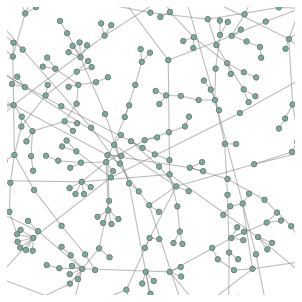

In [80]:
results=visualize(Gtree)

# Carros eletricos

In [81]:
byd=pd.read_csv("DADOS_CARROS/BYD.csv",sep=';')
byd['MARCA']=['BYD']*len(byd)

In [82]:
ford=pd.read_csv("DADOS_CARROS/FORD.csv",sep=';')
ford['MARCA']=['FORD']*len(ford)

In [83]:
renault=pd.read_csv("DADOS_CARROS/RENAULT.csv",sep=';')
renault['MARCA']=['RENAULT']*len(renault)

In [84]:
df=pd.concat([byd,ford,renault],ignore_index=True)
df

,DT_PUBLICACAO,TEXTO,N_CURTIDAS,LINK_PUBLICACAO,DATA_DOWNLOAD,URL_ESP,MARCA
0,2023-09-08,O caminhão BYD eT18 100% elétrico combina 245 ...,136 curtidas,https://www.instagram.com/p/Cw7obPYOA0G/,2024-06-02,https://www.instagram.com/byd_brasil?utm_sourc...,BYD
1,2023-09-12,A BYD possui diversos modelos de empilhadeiras...,80 curtidas,https://www.instagram.com/p/CxGydEoOByf/?img_i...,2024-06-02,https://www.instagram.com/byd_brasil?utm_sourc...,BYD
2,2023-09-13,Com espaço interno otimizado e recarga rápida ...,422 curtidas,https://www.instagram.com/p/CxJNQaWurQH/,2024-06-02,https://www.instagram.com/byd_brasil?utm_sourc...,BYD
3,2023-09-14,Com capacidade para 25 toneladas e recarga com...,85 curtidas,https://www.instagram.com/p/CxLkLCUueAY/,2024-06-02,https://www.instagram.com/byd_brasil?utm_sourc...,BYD
4,2023-09-15,A BYD celebra o Dia do Cliente valorizando cad...,72 curtidas,https://www.instagram.com/p/CxOUjnBO_Wb/,2024-06-02,https://www.instagram.com/byd_brasil?utm_sourc...,BYD
...,...,...,...,...,...,...,...
598,2024-05-31,"O R5 voltou, agora 100% elétrico.\n\no #Renaul...",•,https://www.instagram.com/p/C7odCidBY7x/,2024-06-02,https://www.instagram.com/renaultbrasil?utm_so...,RENAULT
599,2024-05-31,#RolandGarros está recebendo a van autônoma 10...,•,https://www.instagram.com/p/C7pLEAjNAgw/,2024-06-02,https://www.instagram.com/renaultbrasil?utm_so...,RENAULT
600,2024-05-31,"para o Renault 5, não existem regras.\nele est...",•,https://www.instagram.com/p/C7pauwWhDFw/,2024-06-02,https://www.instagram.com/renaultbrasil?utm_so...,RENAULT
601,2024-06-02,uma experiência única da loja #Renault5: o #MA...,•,https://www.instagram.com/p/C7tmhVEqL7b/,2024-06-02,https://www.instagram.com/renaultbrasil?utm_so...,RENAULT


In [85]:
df.MARCA.value_counts()

BYD        201
FORD       201
RENAULT    201
Name: MARCA, dtype: int64

In [86]:
df['LEN_TOKEN']=df['TEXTO'].apply(processamento).apply(len)

In [87]:
df.groupby('MARCA').describe()

LEN_TOKEN                                                     
            count       mean        std   min   25%   50%   75%    max
MARCA                                                                 
BYD         201.0  40.850746  13.786138  11.0  31.0  39.0  47.0  108.0
FORD        201.0  19.134328   9.231298   4.0  13.0  17.0  23.0   55.0
RENAULT     201.0  18.039801   8.169970   5.0  13.0  16.0  22.0   51.0

# Embeddings

In [88]:
model = SentenceTransformer("alfaneo/bertimbau-base-portuguese-sts")

In [89]:
textos_marca=list(df['TEXTO'].values)
len(textos_marca)

603

In [90]:
matriz=model.encode(textos_marca)

In [91]:
pd.DataFrame(matriz)

,0,1,2,3,4,5,6,7,8,9,...,758,759,760,761,762,763,764,765,766,767
0,-0.574981,0.029332,1.217434,0.243761,0.388861,0.757667,-0.123310,0.266431,0.382434,-0.084312,...,0.068003,0.098880,-1.188491,-0.817572,-0.309310,-0.042370,-0.331373,-0.369221,0.208200,-0.879802
1,-0.442147,0.112745,0.814475,0.204859,0.564463,0.022944,-0.191625,0.164886,0.429808,0.123478,...,0.183776,-0.175139,-1.131684,-0.986262,0.409248,-0.088315,-0.661500,0.191587,-0.229023,-0.682961
2,-0.241126,0.005129,0.709584,-0.263671,0.484188,0.331470,-0.592144,0.026265,0.234738,0.173900,...,0.085690,-0.057805,-1.017988,-0.915592,-0.491081,-0.497441,0.143091,-0.003397,0.381239,-0.925771
3,-0.358578,-0.082713,1.027547,0.297401,0.612600,0.461706,-0.045975,0.015264,0.219999,0.116860,...,-0.059764,-0.077569,-1.080727,-0.812804,-0.265843,-0.338267,-0.239373,-0.224097,0.231468,-0.560696
4,-0.118459,0.217434,0.809154,0.301271,0.824409,-0.001449,-0.275638,-0.585159,0.176073,0.225131,...,-0.010889,-0.761789,-1.368925,-0.959016,-0.196169,-0.294101,-0.477642,0.297294,-0.572555,-0.796397
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
598,-0.201232,0.827215,0.436927,0.143219,0.353183,0.789723,-0.724022,0.533982,0.380752,0.740839,...,0.162807,-0.163735,-0.622526,-1.013370,0.545246,-0.828472,-0.138833,-0.643152,-0.032919,-0.883667
599,-0.201440,0.760570,0.561032,0.050528,0.038961,0.470786,-0.829342,0.230335,0.456776,0.019353,...,-0.215093,0.214621,-1.042918,-0.620320,0.580154,-0.541811,0.052287,-0.504320,-0.111839,-1.432145
600,0.014876,0.760581,0.084521,0.083023,0.088178,0.174551,-0.968902,0.427375,0.354098,0.279843,...,0.732035,0.587151,-1.291890,0.022090,1.073456,-0.606701,-0.490147,-0.336522,-0.443719,-1.392342
601,-0.140183,0.910975,0.547483,-0.421188,-0.122813,0.187173,-0.693157,0.518288,0.299079,1.087650,...,0.125969,-0.267727,-0.422969,-0.688862,-0.036636,-0.487391,0.123377,-0.350001,-0.006823,-0.859564


In [92]:
from sklearn.manifold import TSNE

In [93]:
X=matriz
y=df['MARCA'].values
tse=TSNE(n_components=2,perplexity=10,n_iter=20000,init='random',random_state=42)
X_tse=tse.fit_transform(X)

/home/jlbdearaujo/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


In [94]:
X_tse.shape

(603, 2)

In [95]:
marcas=df['MARCA'].unique()
marcas

array(['BYD', 'FORD', 'RENAULT'], dtype=object)

In [96]:
cores=['orange','blue','red']
dic=dict(zip(marcas,cores))
dic
listacor=[dic[v] for v in y]

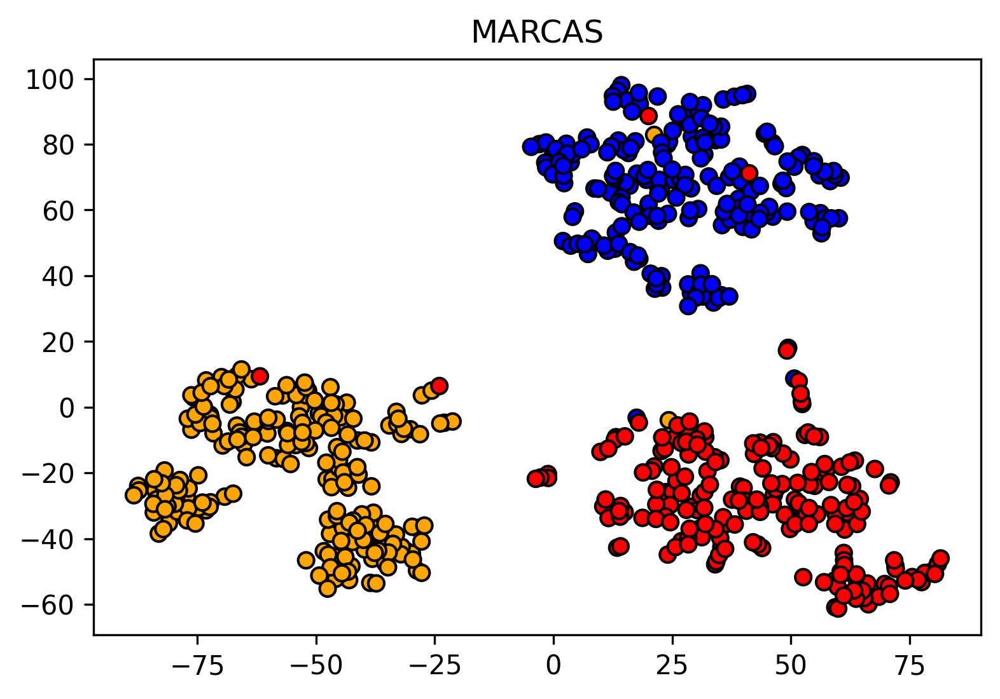

In [97]:
plt.figure(dpi=300)
plt.title('MARCAS')
plt.scatter(X_tse[:,0],X_tse[:,1],c=listacor,edgecolors='black')

# Clusterização

In [98]:
from sklearn.cluster import DBSCAN

In [99]:
clustering=DBSCAN(eps=10,min_samples=1).fit(X_tse)

In [100]:
ncluster=[]
episo=np.linspace(5,15,30)
for epi in episo:
    clustering=DBSCAN(eps=epi,min_samples=1).fit(X_tse)
    ncluster.append(pd.Series(clustering.labels_).nunique())

In [101]:
len(episo)

30

Text(0, 0.5, 'N_cluster')

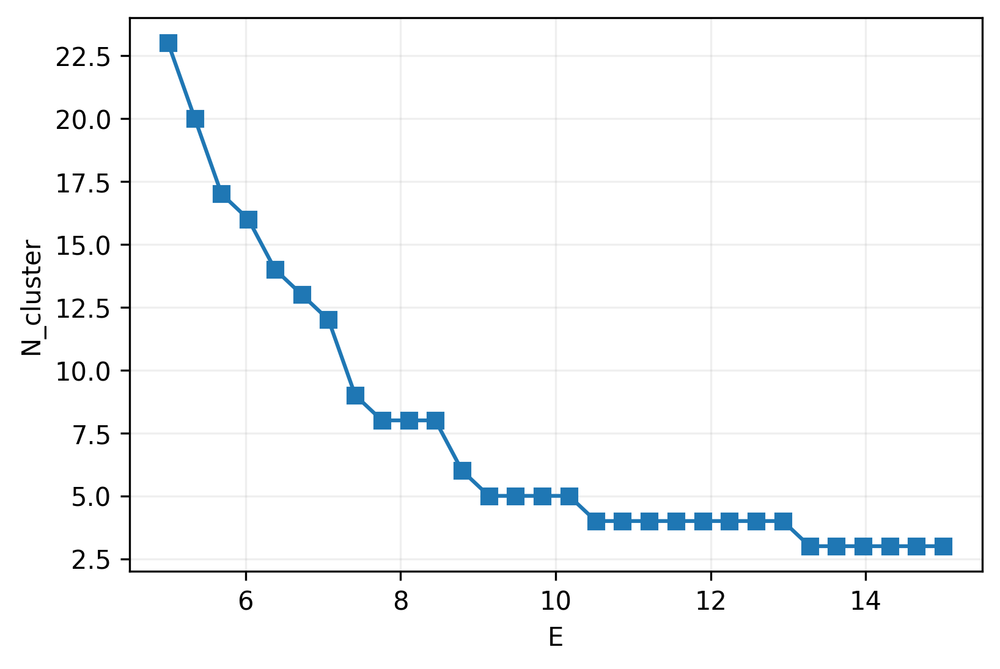

In [102]:
plt.figure(dpi=300)
plt.grid(alpha=0.2)
plt.plot(episo,ncluster,marker='s')
plt.xlabel('E')
plt.ylabel('N_cluster')

In [103]:
clustering=DBSCAN(eps=10,min_samples=1).fit(X_tse)

In [104]:
df["CLUSTER"]=clustering.labels_

In [105]:
df["CLUSTER"].value_counts()

3    201
2    197
0    165
1     36
4      4
Name: CLUSTER, dtype: int64

In [106]:
yy=df["CLUSTER"].values

In [107]:
cores=['orange','blue','red',"purple",'green']
dic=dict(zip(df["CLUSTER"].unique(),cores))
dic
listacor_cluster=[dic[v] for v in yy]

In [108]:
dic

{0: 'orange', 1: 'blue', 2: 'red', 3: 'purple', 4: 'green'}

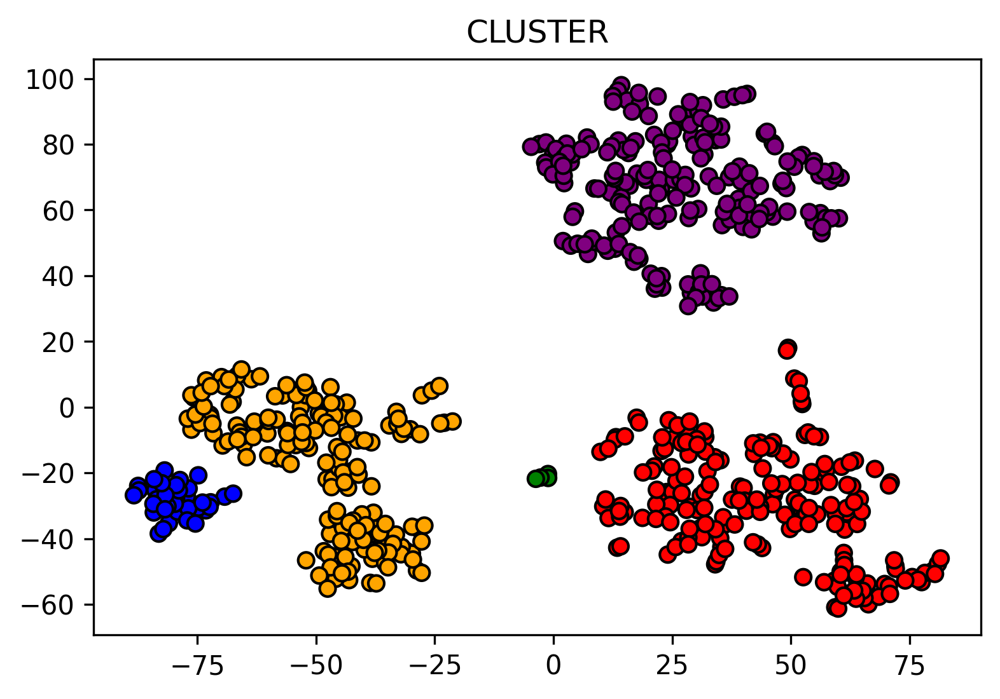

In [109]:
plt.figure(dpi=300)
plt.title('CLUSTER')
plt.scatter(X_tse[:,0],X_tse[:,1],c=listacor_cluster,edgecolors='black')

In [110]:
conteudo=""
for texto in df[df['CLUSTER']==1].TEXTO.values:
    try:
        conteudo=conteudo+" "+texto
    except:
        pass

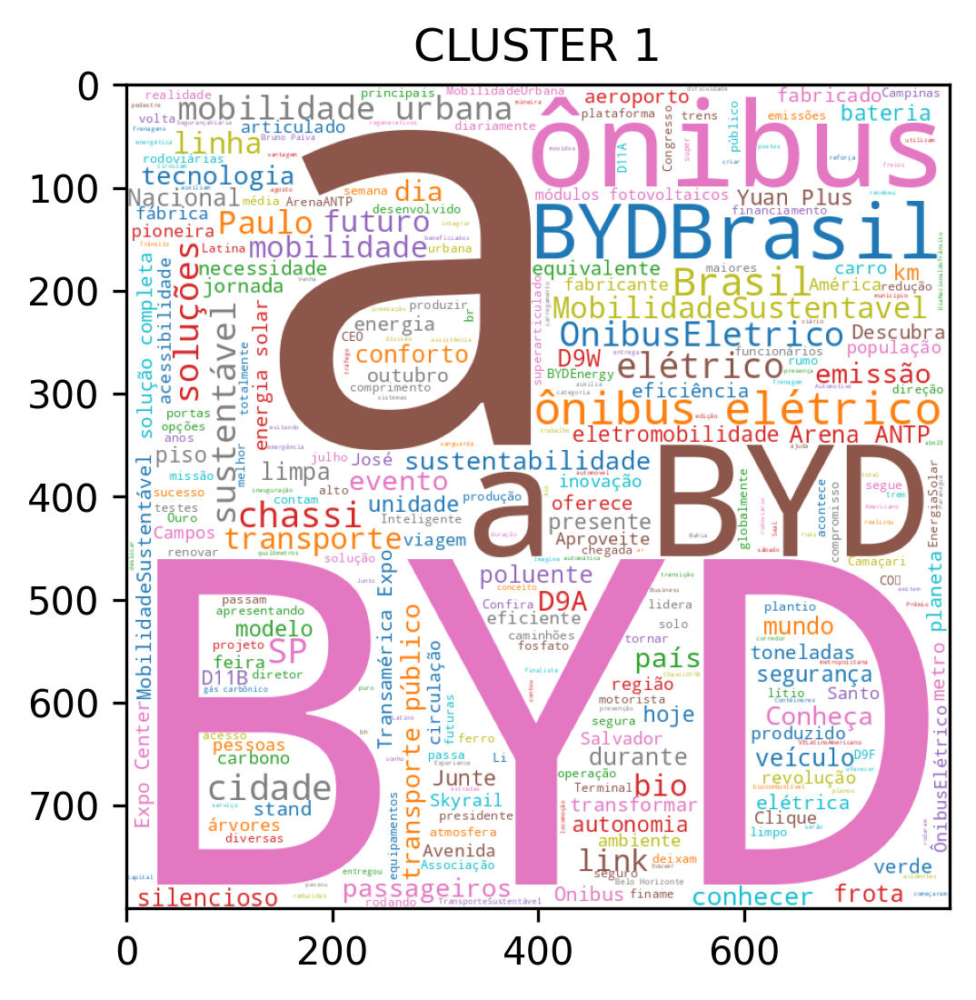

In [111]:
cloud=WordCloud(background_color="white",max_words=300,colormap='tab10',stopwords = stop_words, width = 800, height = 800)
cloud=cloud.generate(conteudo)
plt.figure(dpi=300)
plt.title('CLUSTER 1')
plt.imshow(cloud)

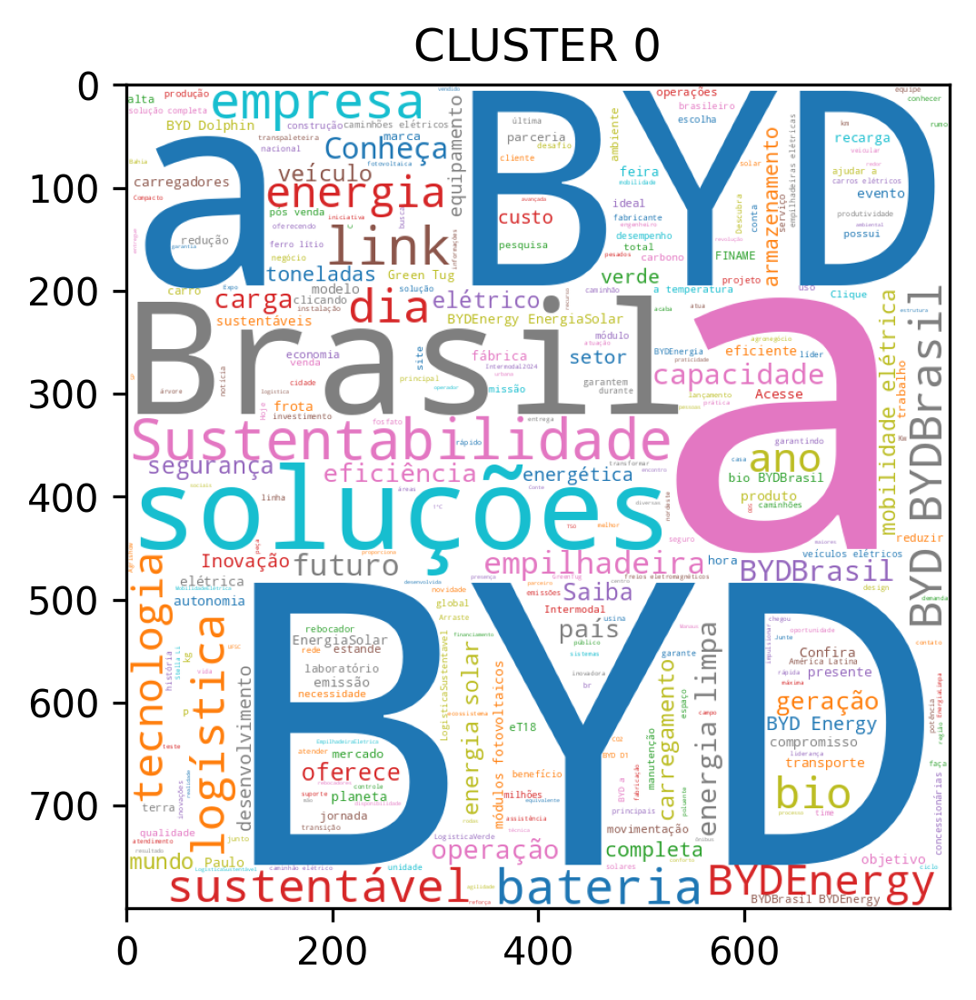

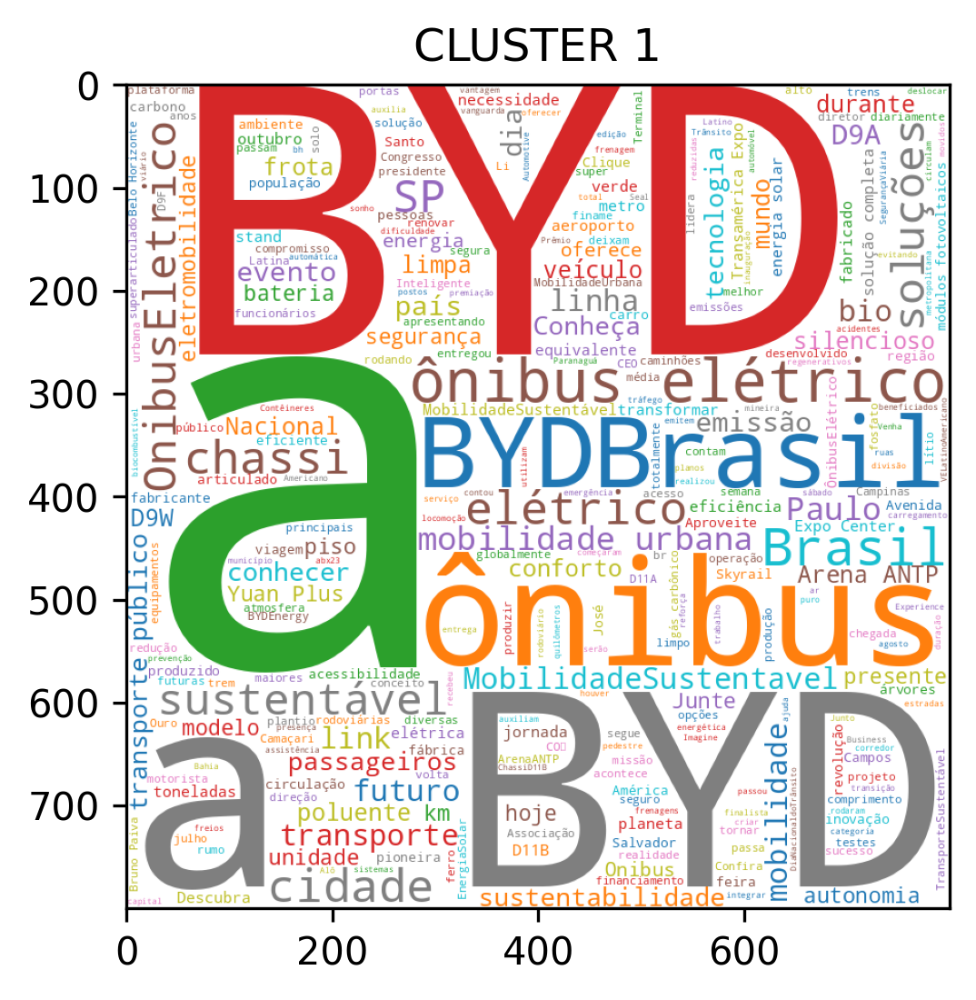

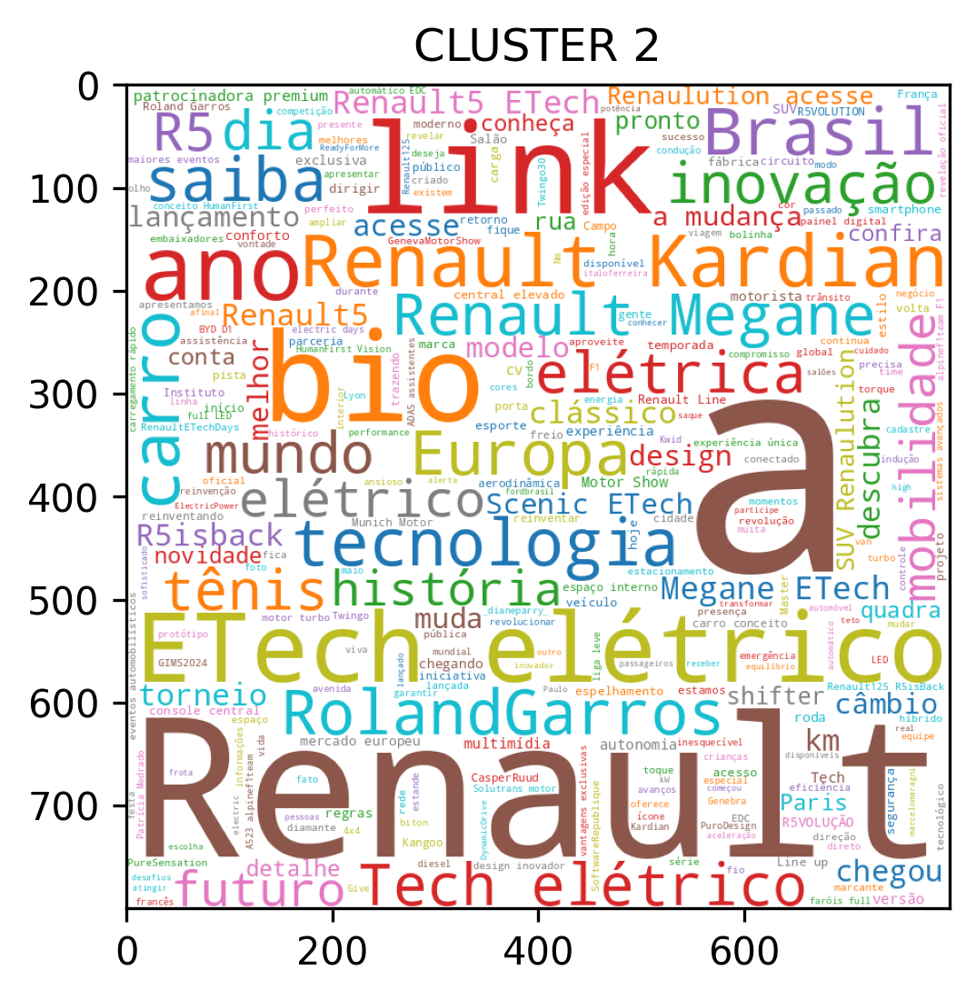

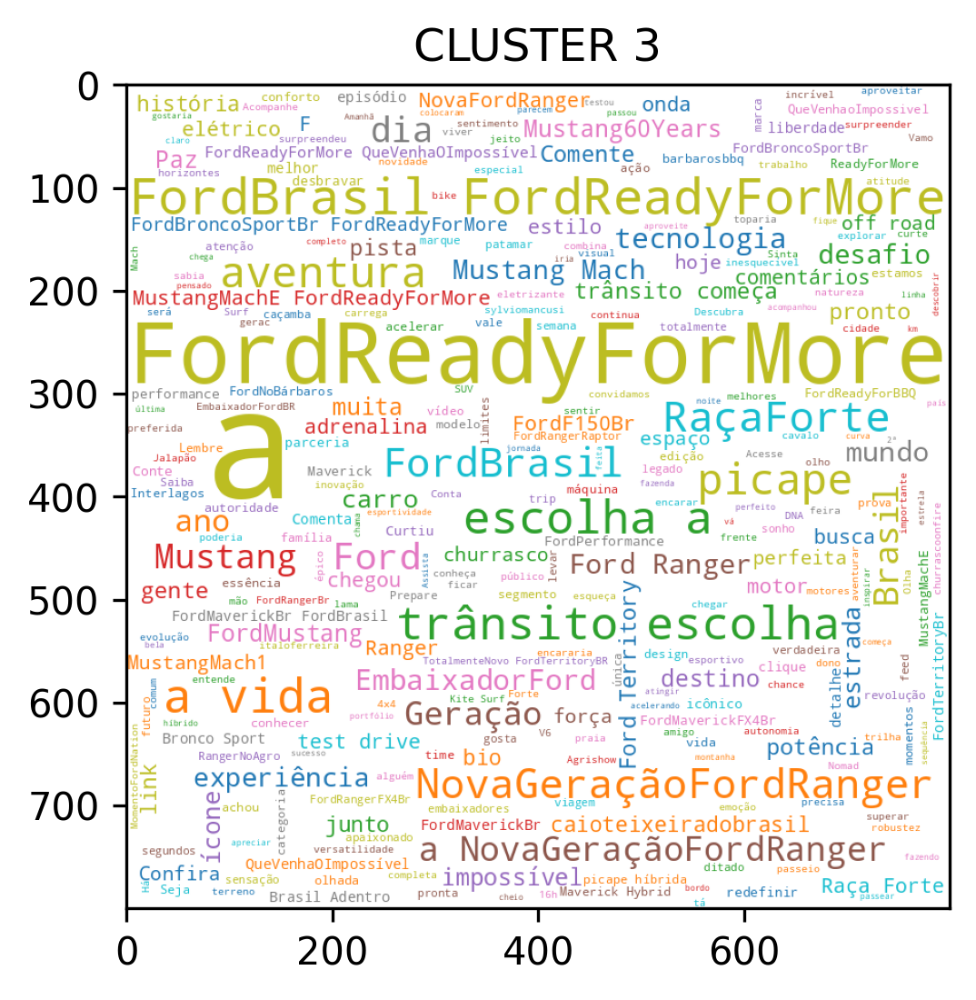

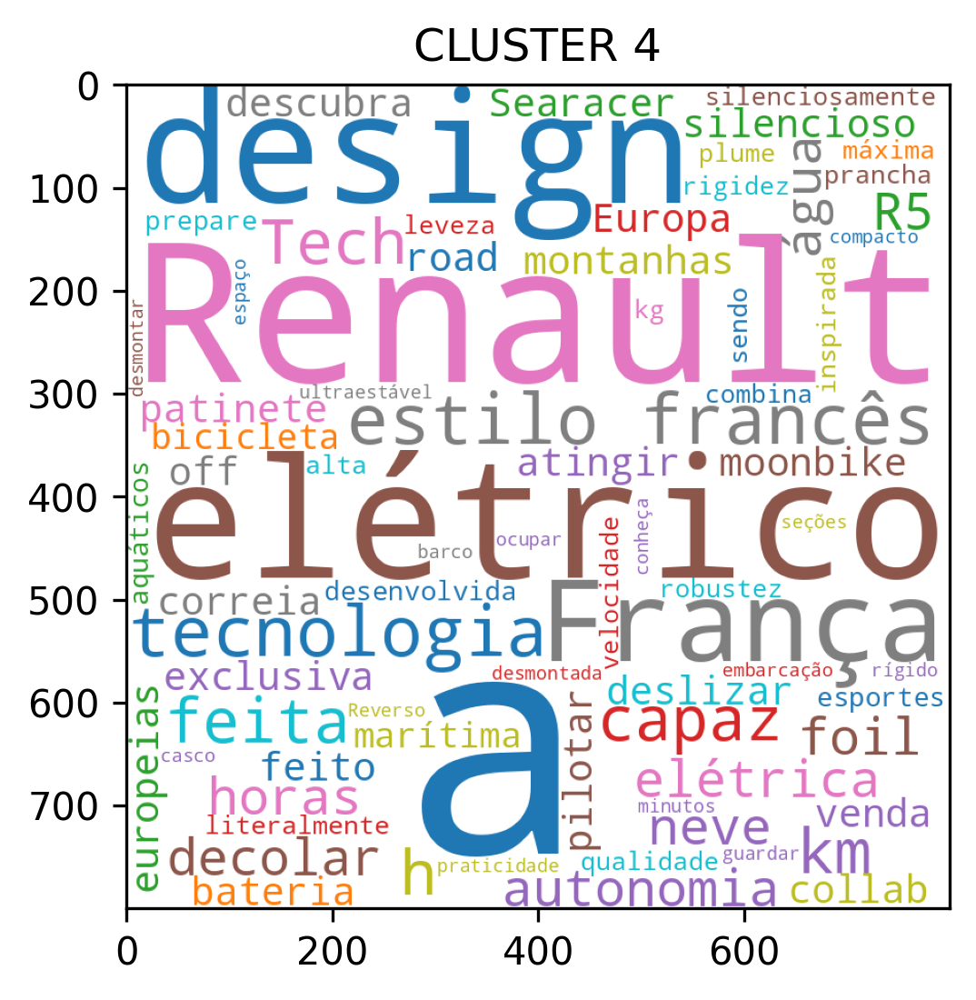

In [112]:
for cc in df.CLUSTER.unique():

    conteudo=""
    for texto in df[df['CLUSTER']==cc].TEXTO.values:
        try:
            conteudo=conteudo+" "+texto
        except:
            pass

    cloud=WordCloud(background_color="white",max_words=300,colormap='tab10',stopwords = stop_words, width = 800, height = 800)
    cloud=cloud.generate(conteudo)
    plt.figure(dpi=300)
    plt.title(f'CLUSTER {cc}')
    plt.imshow(cloud)

In [113]:
df[df.CLUSTER==4]

,DT_PUBLICACAO,TEXTO,N_CURTIDAS,LINK_PUBLICACAO,DATA_DOWNLOAD,URL_ESP,MARCA,LEN_TOKEN,CLUSTER
549,2024-03-11,deslizar sobre a neve das montanhas europeias ...,•,https://www.instagram.com/p/C4YPSZ3KYid/,2024-06-02,https://www.instagram.com/renaultbrasil?utm_so...,RENAULT,32,4
551,2024-03-12,descubra como seria pilotar um off-road elétri...,•,https://www.instagram.com/p/C4bJPXLIpa2/,2024-06-02,https://www.instagram.com/renaultbrasil?utm_so...,RENAULT,24,4
552,2024-03-12,prepare-se para decolar silenciosamente sobre ...,•,https://www.instagram.com/p/C4ad1CgoHk3/,2024-06-02,https://www.instagram.com/renaultbrasil?utm_so...,RENAULT,47,4
553,2024-03-12,praticidade é poder desmontar sua embarcação e...,•,https://www.instagram.com/p/C4a0Oz6IdE7/,2024-06-02,https://www.instagram.com/renaultbrasil?utm_so...,RENAULT,31,4


In [114]:
from sklearn.linear_model import LogisticRegression

In [115]:
clf=LogisticRegression(max_iter=10000,random_state=42).fit(matriz,df['MARCA'].values)

In [116]:
texto="Lula"
clf.predict(model.encode([texto]))

array(['FORD'], dtype=object)

# Outros marcas

In [117]:
nissan=pd.read_csv('DADOS_CARROS/NISSAN.csv',sep=';')
res_nissan=clf.predict(model.encode(nissan['TEXTO'].values))


In [118]:
pd.Series(res_nissan).value_counts(normalize=True)

FORD       0.616915
RENAULT    0.353234
BYD        0.029851
dtype: float64

In [119]:
audi=pd.read_csv('DADOS_CARROS/AUDI.csv',sep=';')
res_audi=clf.predict(model.encode(audi['TEXTO'].values))
pd.Series(res_audi).value_counts(normalize=True)

RENAULT    0.656716
FORD       0.258706
BYD        0.084577
dtype: float64

In [120]:
volvo=pd.read_csv('DADOS_CARROS/VOLVO.csv',sep=';')
res_volvo=clf.predict(model.encode(volvo['TEXTO'].values))
pd.Series(res_volvo).value_counts(normalize=True)

BYD        0.368159
FORD       0.348259
RENAULT    0.283582
dtype: float64

# Sentimentos

In [121]:
sentimentos=pd.read_csv('BASE_PROCESSED.csv',sep=';')
sentimentos

,TEXTO,sentimento
0,este trabalho e agradável,alegria
1,gosto de ficar no seu aconchego,alegria
2,fiz a adesão ao curso hoje,alegria
3,eu sou admirada por muitos,alegria
4,adoro como você e,alegria
...,...,...
761,acho que isso e defeituoso,tristeza
762,os remedios me derrubam na cama,tristeza
763,a depressão vai me derrubar,tristeza
764,suas desculpas são falsas,tristeza


In [122]:
sentimentos.sentimento.value_counts()

alegria     160
desgosto    126
medo        120
raiva       120
surpresa    120
tristeza    120
Name: sentimento, dtype: int64

In [123]:
matriz=model.encode(sentimentos.TEXTO.values)
y=sentimentos['sentimento'].values

In [124]:
clf_sentimento=LogisticRegression(max_iter=10000,random_state=42).fit(matriz,y)

In [125]:
res_sen_byd=clf_sentimento.predict(model.encode(df[df.MARCA=='BYD'].TEXTO.values))
res_sen_byd

array(['surpresa', 'surpresa', 'surpresa', 'surpresa', 'alegria',
       'alegria', 'alegria', 'surpresa', 'surpresa', 'desgosto',
       'alegria', 'alegria', 'alegria', 'surpresa', 'surpresa', 'raiva',
       'surpresa', 'surpresa', 'alegria', 'surpresa', 'surpresa',
       'alegria', 'surpresa', 'alegria', 'surpresa', 'alegria', 'alegria',
       'surpresa', 'surpresa', 'desgosto', 'surpresa', 'surpresa',
       'alegria', 'alegria', 'medo', 'raiva', 'surpresa', 'alegria',
       'alegria', 'surpresa', 'surpresa', 'alegria', 'surpresa', 'raiva',
       'surpresa', 'desgosto', 'raiva', 'surpresa', 'surpresa', 'alegria',
       'alegria', 'raiva', 'surpresa', 'alegria', 'surpresa', 'surpresa',
       'surpresa', 'surpresa', 'alegria', 'alegria', 'alegria',
       'surpresa', 'alegria', 'surpresa', 'raiva', 'surpresa', 'surpresa',
       'raiva', 'raiva', 'surpresa', 'alegria', 'surpresa', 'alegria',
       'alegria', 'alegria', 'desgosto', 'surpresa', 'alegria',
       'surpresa', 'al

In [126]:
pd.Series(res_sen_byd).value_counts(normalize=True)

surpresa    0.487562
alegria     0.378109
raiva       0.074627
desgosto    0.054726
medo        0.004975
dtype: float64

In [127]:
byd=pd.DataFrame({'TEXTO':df[df.MARCA=='BYD'].TEXTO.values,'sentimento':res_sen_byd})
byd

,TEXTO,sentimento
0,O caminhão BYD eT18 100% elétrico combina 245 ...,surpresa
1,A BYD possui diversos modelos de empilhadeiras...,surpresa
2,Com espaço interno otimizado e recarga rápida ...,surpresa
3,Com capacidade para 25 toneladas e recarga com...,surpresa
4,A BYD celebra o Dia do Cliente valorizando cad...,alegria
...,...,...
196,"Os carregadores BYD-EVC-2SXM60 (60 Kw), EVC-2S...",alegria
197,"Pensado para o futuro, o BYD Green Tug é total...",surpresa
198,"Com os caminhões BYD, você tem mais tempo na e...",surpresa
199,A BYD reconhece o trabalho e a habilidade do o...,alegria


In [128]:
len(byd[byd.sentimento=='raiva'])

15

In [129]:
print(byd[byd.sentimento=='alegria'].TEXTO.values[20])

O FINAME é um modelo de financiamento oferecido pelo BNDES que tem como objetivo auxiliar empresas de todos os portes e setores na aquisição de bens de produção nacional.

A BYD, como maior fabricante de módulos fotovoltaicos do Brasil, é uma empresa contemplada pelo financiamento.

Arraste para o lado para aprender como solicitar o benefício e adquirir sua solução completa de energia solar BYD.

Em caso de dúvidas, acesse bydenergia.com e conte com um time especializado para o seu atendimento.
#BYDEnergy #BYDBrasil #FINAME


In [130]:
conteudo=""
for texto in byd[byd.sentimento=='raiva'].TEXTO.values:
    try:
        conteudo=conteudo+" "+texto
    except:
        pass

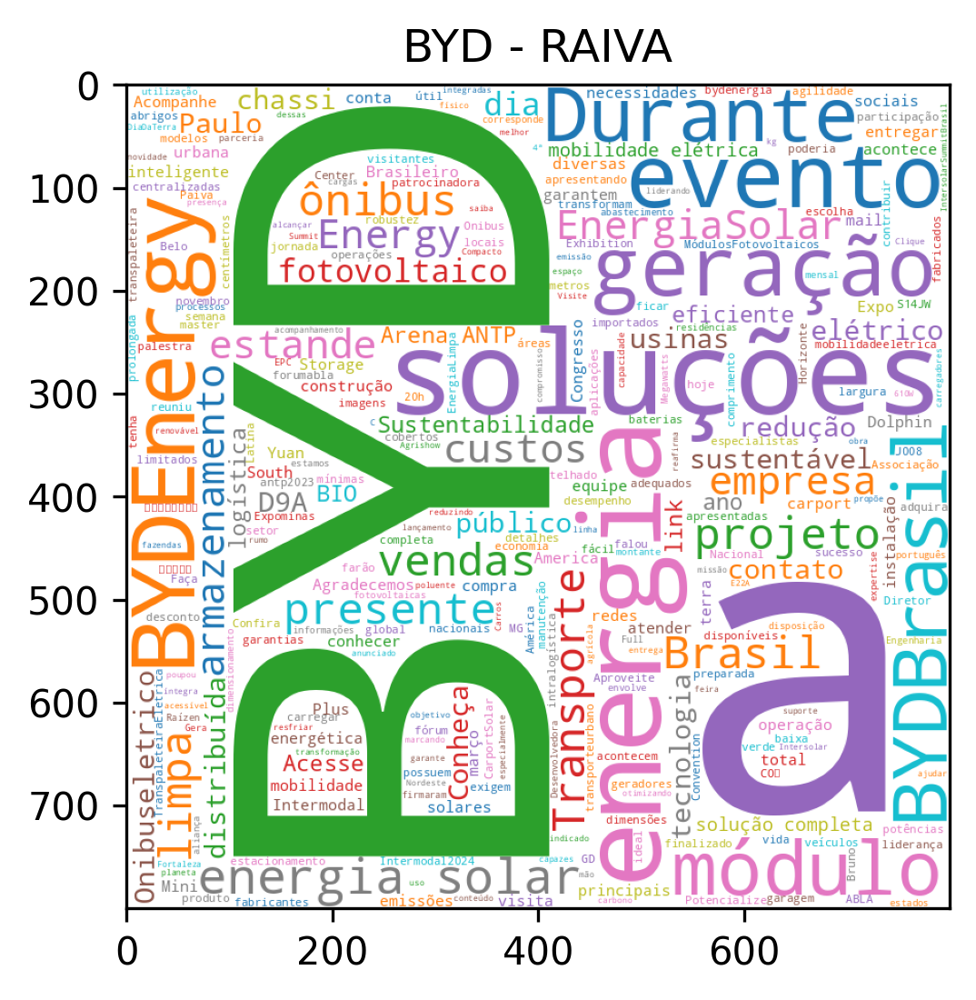

In [131]:
cloud=WordCloud(background_color="white",max_words=300,colormap='tab10',stopwords = stop_words, width = 800, height = 800)
cloud=cloud.generate(conteudo)
plt.figure(dpi=300)
plt.title('BYD - RAIVA')
plt.imshow(cloud)

In [132]:
conteudo=""
for texto in byd[byd.sentimento=='alegria'].TEXTO.values:
    try:
        conteudo=conteudo+" "+texto
    except:
        pass

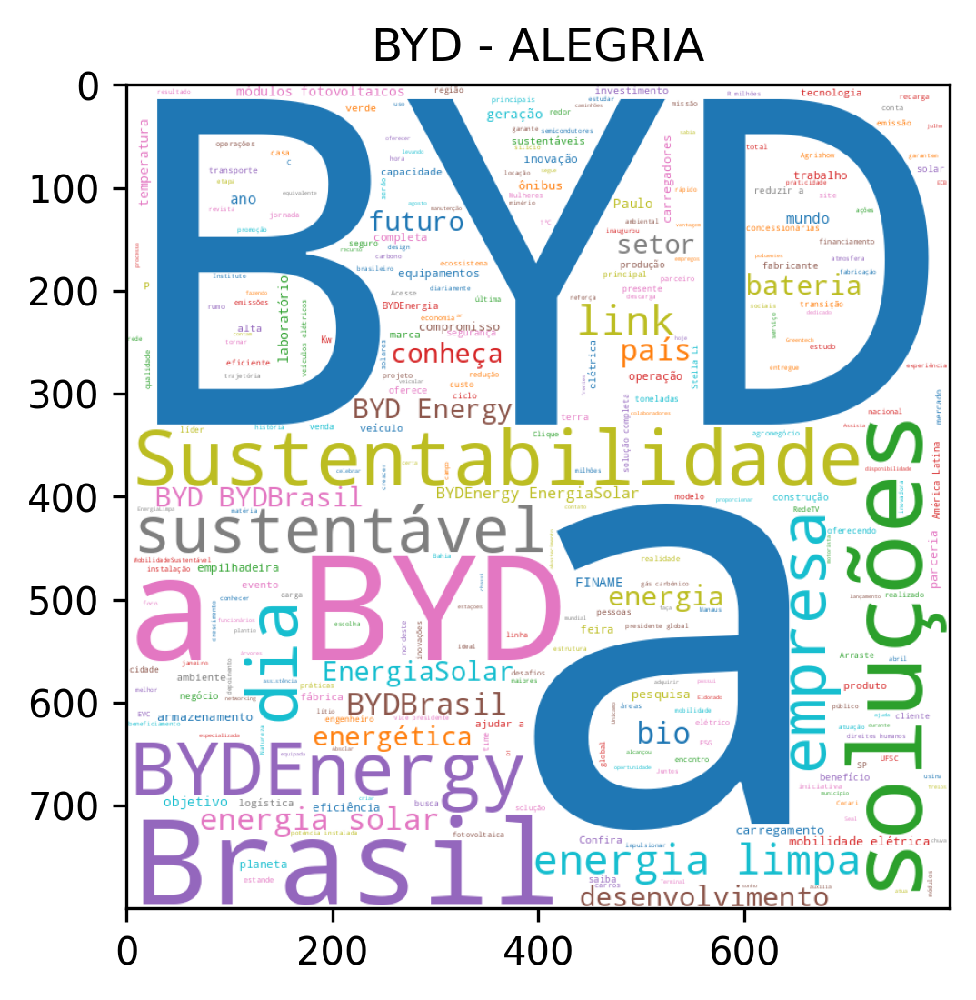

In [133]:
cloud=WordCloud(background_color="white",max_words=300,colormap='tab10',stopwords = stop_words, width = 800, height = 800)
cloud=cloud.generate(conteudo)
plt.figure(dpi=300)
plt.title('BYD - ALEGRIA')
plt.imshow(cloud)

In [134]:
conteudo=""
for texto in byd[byd.sentimento=='desgosto'].TEXTO.values:
    try:
        conteudo=conteudo+" "+texto
    except:
        pass

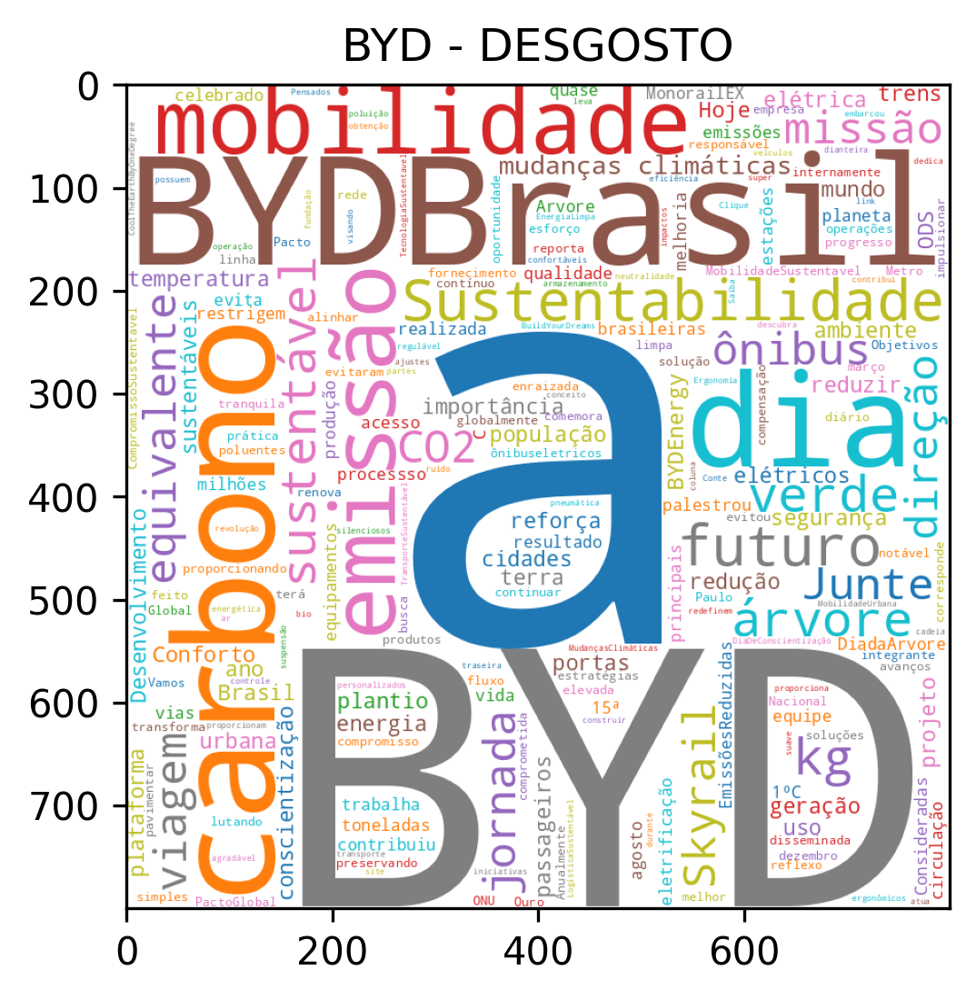

In [135]:
cloud=WordCloud(background_color="white",max_words=300,colormap='tab10',stopwords = stop_words, width = 800, height = 800)
cloud=cloud.generate(conteudo)
plt.figure(dpi=300)
plt.title('BYD - DESGOSTO')
plt.imshow(cloud)

In [136]:
res_sen_ford=clf_sentimento.predict(model.encode(df[df.MARCA=='FORD'].TEXTO.values))
res_sen_ford

array(['surpresa', 'surpresa', 'surpresa', 'surpresa', 'surpresa',
       'surpresa', 'surpresa', 'surpresa', 'surpresa', 'surpresa',
       'surpresa', 'desgosto', 'surpresa', 'surpresa', 'surpresa',
       'surpresa', 'surpresa', 'surpresa', 'surpresa', 'surpresa',
       'surpresa', 'surpresa', 'surpresa', 'surpresa', 'surpresa',
       'surpresa', 'surpresa', 'desgosto', 'surpresa', 'surpresa',
       'surpresa', 'surpresa', 'surpresa', 'surpresa', 'surpresa',
       'surpresa', 'surpresa', 'surpresa', 'surpresa', 'surpresa',
       'surpresa', 'surpresa', 'surpresa', 'surpresa', 'surpresa',
       'surpresa', 'surpresa', 'surpresa', 'surpresa', 'desgosto',
       'surpresa', 'surpresa', 'surpresa', 'surpresa', 'surpresa',
       'surpresa', 'surpresa', 'surpresa', 'surpresa', 'raiva',
       'surpresa', 'surpresa', 'surpresa', 'surpresa', 'surpresa',
       'surpresa', 'surpresa', 'desgosto', 'surpresa', 'surpresa',
       'surpresa', 'surpresa', 'surpresa', 'surpresa', 'surpresa'

In [137]:
pd.Series(res_sen_ford).value_counts(normalize=True)

surpresa    0.925373
desgosto    0.039801
alegria     0.019900
medo        0.009950
raiva       0.004975
dtype: float64

# LLM

In [138]:
import pandas as pd 
import matplotlib.pyplot as plt 
import seaborn as sns 
import numpy as np 
import string 
import spacy 
from spacy.lang.pt.stop_words import STOP_WORDS
from sklearn.metrics import accuracy_score, confusion_matrix, f1_score, roc_auc_score
from sklearn.linear_model import LogisticRegression
from tqdm import tqdm 
from sklearn.metrics.pairwise import cosine_distances,cosine_similarity

In [139]:
import openai 
from openai import OpenAI

In [ ]:
import openai
from openai import OpenAI
import os
apinumber=os.getenv("OPENAI_API_KEY")
openai.api_key = apinumber
client = OpenAI(api_key=apinumber)

In [143]:
models = client.models.list()

In [144]:
for i in range(len(models.data)):
    print(models.data[i].id)

gpt-4o-mini-audio-preview-2024-12-17
gpt-4-turbo-2024-04-09
dall-e-3
dall-e-2
gpt-4o-audio-preview-2024-10-01
gpt-4o-audio-preview
gpt-4-0314
gpt-4o
o1-mini-2024-09-12
gpt-4o-mini-realtime-preview-2024-12-17
o1-preview-2024-09-12
o1-mini
o1-preview
gpt-4o-mini-realtime-preview
whisper-1
gpt-4-turbo
gpt-4-32k-0314
gpt-4o-mini-audio-preview
gpt-4o-2024-08-06
gpt-4o-realtime-preview-2024-10-01
babbage-002
gpt-4o-mini-2024-07-18
tts-1-hd-1106
o1
gpt-4o-audio-preview-2024-12-17
o1-2024-12-17
gpt-4o-mini
tts-1-hd
o3-mini-2025-01-31
o3-mini
tts-1
tts-1-1106
davinci-002
gpt-3.5-turbo-1106
omni-moderation-2024-09-26
gpt-3.5-turbo-instruct
chatgpt-4o-latest
gpt-3.5-turbo-instruct-0914
gpt-3.5-turbo-0125
gpt-4o-realtime-preview-2024-12-17
gpt-3.5-turbo
gpt-4o-realtime-preview
gpt-3.5-turbo-16k
text-embedding-3-small
gpt-4
gpt-4-1106-preview
text-embedding-ada-002
omni-moderation-latest
gpt-4-0613
gpt-4o-2024-11-20
gpt-4-turbo-preview
gpt-4-0125-preview
gpt-4o-2024-05-13
text-embedding-3-large
dav